In [1]:
import json 
import os
import logging 

from pathlib import Path 
from pprint import PrettyPrinter

from subgrounds import Subgrounds
from web3 import Web3
from pycoingecko import CoinGeckoAPI

from prefect.client import get_client
from dotenv import load_dotenv

import pandas as pd 
import numpy as np 
import altair as alt 
import missingno as miss

from flywheel_util.constants import (
    colors_24,
    colors_28, 
    addresses, 
    url_infura, 
    url_snapshot, 
    url_subgraphs, 
    snapshot_api_max_records_per_request, 
    snapshot_api_max_skip,
)
from flywheel_util.tasks.general import df_to_sql
from flywheel_util.utils.util import (
    ddf, 
    first_row, 
)

from sqlalchemy import create_engine
from sqlalchemy import text
engine = create_engine("sqlite+pysqlite:///votium_bribes.db", echo=False, future=True)

# logging.basicConfig(level=logging.INFO)

assert load_dotenv('../../.env') 

logging.basicConfig(level=logging.DEBUG)

pp = PrettyPrinter().pprint

alt.data_transformers.disable_max_rows()
alt.renderers.enable('jupyterlab')

/opt/miniconda3/envs/flywheel-testing/lib/python3.10/site-packages/eth_utils/toolz.py:2: DeprecationWarning: The toolz.compatibility module is no longer needed in Python 3 and has been deprecated. Please import these utilities directly from the standard library. This module will be removed in a future release.
  from cytoolz import (
/opt/miniconda3/envs/flywheel-testing/lib/python3.10/site-packages/web3/_utils/normalizers.py:231: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(eth_abi.__version__) < LooseVersion("2"):


RendererRegistry.enable('jupyterlab')

In [2]:
infura_url = f'https://mainnet.infura.io/v3/{os.environ["INFURA_API_KEY"]}'
w3 = Web3(Web3.HTTPProvider(infura_url))
cg = CoinGeckoAPI()

In [3]:
sg = Subgrounds()
sg_curve_pools = sg.load_subgraph(url_subgraphs.convex.curve_pools) 
sg_curve_vol = sg.load_subgraph(url_subgraphs.convex.curve_vol_mainnet)
sg_votium = sg.load_subgraph(url_subgraphs.votium.bribes) 

In [4]:
url_subgraphs.convex.curve_vol_mainnet

'https://api.thegraph.com/subgraphs/name/convex-community/volume-mainnet'

In [5]:
# df.head()

## Curve Liquidity for FraxBP + FraxBP Metapools

In [6]:
%load_ext autoreload
%autoreload 2

In [7]:
from flywheel_util.flows.fraxbp import flow_fraxbp_metapool_data
df_pools, df_coins, df_pool_coin, df_pool_snaps, df_mpool_snaps, df_reserves = flow_fraxbp_metapool_data()

14:00:26.555 | INFO    | prefect.engine - Created flow run 'psychedelic-wallaby' for flow 'flow-fraxbp-metapool-data'

/opt/miniconda3/envs/flywheel-testing/lib/python3.10/site-packages/prefect/orion/models/block_schemas.py:729: RemovedIn20Warning: Deprecated API features detected! These feature(s) are not compatible with SQLAlchemy 2.0. To prevent incompatible upgrades prior to updating applications, ensure requirements files are pinned to "sqlalchemy<2.0". Set environment variable SQLALCHEMY_WARN_20=1 to show all deprecation warnings.  Set environment variable SQLALCHEMY_SILENCE_UBER_WARNING=1 to silence this message. (Background on SQLAlchemy 2.0 at: https://sqlalche.me/e/b8d9)
  sa.select(


14:00:26.629 | INFO    | Flow run 'psychedelic-wallaby' - Created task run 'query_curve_mpools_with_gauge-272fe162-0' for task 'query_curve_mpools_with_gauge'

14:00:26.630 | INFO    | Flow run 'psychedelic-wallaby' - Submitted task run 'query_curve_mpools_with_gauge-272fe162-0' for execution.

14:00:26.639 | INFO    | Flow run 'psychedelic-wallaby' - Created task run 'query_curve_pool_vol_snapshots-d13ece1a-0' for task 'query_curve_pool_vol_snapshots'

14:00:26.640 | INFO    | Flow run 'psychedelic-wallaby' - Submitted task run 'query_curve_pool_vol_snapshots-d13ece1a-0' for execution.

14:00:26.655 | INFO    | Flow run 'psychedelic-wallaby' - Created task run 'query_curve_pool_snapshots-f9e3a88e-0' for task 'query_curve_pool_snapshots'

14:00:26.655 | INFO    | Flow run 'psychedelic-wallaby' - Submitted task run 'query_curve_pool_snapshots-f9e3a88e-0' for execution.

14:00:26.680 | INFO    | Flow run 'psychedelic-wallaby' - Created task run 'compute_pool_dfs-a81fd5b0-0' for task 'compute_pool_dfs'

14:00:26.681 | INFO    | Flow run 'psychedelic-wallaby' - Executing 'compute_pool_dfs-a81fd5b0-0' immediately...

14:00:27.056 | INFO    | Task run 'query_curve_mpools_with_gauge-272fe162-0' - Finished in state Completed()

14:00:50.678 | INFO    | Task run 'query_curve_pool_snapshots-f9e3a88e-0' - Finished in state Completed()

14:00:50.722 | INFO    | Task run 'compute_pool_dfs-a81fd5b0-0' - Finished in state Completed()

14:00:50.734 | INFO    | Flow run 'psychedelic-wallaby' - Created task run 'remove_inactive_pools-32f663aa-0' for task 'remove_inactive_pools'

14:00:50.735 | INFO    | Flow run 'psychedelic-wallaby' - Executing 'remove_inactive_pools-32f663aa-0' immediately...

14:01:43.207 | INFO    | Task run 'query_curve_pool_vol_snapshots-d13ece1a-0' - Finished in state Completed()

Removing pools Curve.fi Factory Crypto Pool: BENT/FraxBP, Curve.fi Factory USD Metapool: cUSD/FRAXBP


14:01:43.245 | INFO    | Task run 'remove_inactive_pools-32f663aa-0' - Finished in state Completed()

14:01:43.260 | INFO    | Flow run 'psychedelic-wallaby' - Created task run 'query_convex_yield-d9f5b125-0' for task 'query_convex_yield'

14:01:43.261 | INFO    | Flow run 'psychedelic-wallaby' - Executing 'query_convex_yield-d9f5b125-0' immediately...

14:01:52.427 | INFO    | Task run 'query_convex_yield-d9f5b125-0' - Finished in state Completed()

14:01:52.686 | INFO    | Flow run 'psychedelic-wallaby' - Created task run 'compute_metapool_snaps-38f9b708-0' for task 'compute_metapool_snaps'

14:01:52.687 | INFO    | Flow run 'psychedelic-wallaby' - Executing 'compute_metapool_snaps-38f9b708-0' immediately...

14:01:52.719 | INFO    | Task run 'compute_metapool_snaps-38f9b708-0' - Finished in state Completed()

14:01:52.730 | INFO    | Flow run 'psychedelic-wallaby' - Created task run 'query_metapool_paired_asset_global_volume-6667d060-0' for task 'query_metapool_paired_asset_global_volume'

14:01:52.731 | INFO    | Flow run 'psychedelic-wallaby' - Executing 'query_metapool_paired_asset_global_volume-6667d060-0' immediately...

Missing data for clevUSD
Missing data for cUSD
Missing data for msUSD


14:01:53.733 | INFO    | Task run 'query_metapool_paired_asset_global_volume-6667d060-0' - Finished in state Completed()

Discovered 24 metapools.
Number of pools with gauges: 24


14:01:53.765 | INFO    | Flow run 'psychedelic-wallaby' - Created task run 'df_to_sql-e5581f58-0' for task 'df_to_sql'

14:01:53.766 | INFO    | Flow run 'psychedelic-wallaby' - Submitted task run 'df_to_sql-e5581f58-0' for execution.

14:01:53.776 | INFO    | Flow run 'psychedelic-wallaby' - Created task run 'df_to_sql-e5581f58-5' for task 'df_to_sql'

14:01:53.777 | INFO    | Flow run 'psychedelic-wallaby' - Submitted task run 'df_to_sql-e5581f58-5' for execution.

14:01:53.789 | INFO    | Flow run 'psychedelic-wallaby' - Created task run 'df_to_sql-e5581f58-1' for task 'df_to_sql'

14:01:53.790 | INFO    | Flow run 'psychedelic-wallaby' - Submitted task run 'df_to_sql-e5581f58-1' for execution.

14:01:53.833 | INFO    | Flow run 'psychedelic-wallaby' - Created task run 'df_to_sql-e5581f58-4' for task 'df_to_sql'

14:01:53.834 | INFO    | Flow run 'psychedelic-wallaby' - Submitted task run 'df_to_sql-e5581f58-4' for execution.

14:01:53.840 | INFO    | Task run 'df_to_sql-e5581f58-0' - Finished in state Completed()

14:01:53.892 | INFO    | Flow run 'psychedelic-wallaby' - Created task run 'df_to_sql-e5581f58-3' for task 'df_to_sql'

14:01:53.893 | INFO    | Flow run 'psychedelic-wallaby' - Submitted task run 'df_to_sql-e5581f58-3' for execution.

14:01:53.915 | INFO    | Task run 'df_to_sql-e5581f58-1' - Finished in state Completed()

14:01:53.953 | INFO    | Flow run 'psychedelic-wallaby' - Created task run 'df_to_sql-e5581f58-2' for task 'df_to_sql'

14:01:53.954 | INFO    | Flow run 'psychedelic-wallaby' - Submitted task run 'df_to_sql-e5581f58-2' for execution.

14:01:53.963 | INFO    | Task run 'df_to_sql-e5581f58-5' - Finished in state Completed()

14:01:54.026 | INFO    | Task run 'df_to_sql-e5581f58-3' - Finished in state Completed()

14:01:54.062 | INFO    | Task run 'df_to_sql-e5581f58-2' - Finished in state Completed()

14:01:54.080 | INFO    | Task run 'df_to_sql-e5581f58-4' - Finished in state Completed()

14:01:54.110 | INFO    | Flow run 'psychedelic-wallaby' - Finished in state Completed()

sys:1: ResourceWarning: Unclosed socket <zmq.Socket(zmq.PUSH) at 0x29fb59d20>
sys:1: ResourceWarning: Unclosed socket <zmq.Socket(zmq.PUSH) at 0x29eb42da0>
sys:1: ResourceWarning: Unclosed socket <zmq.Socket(zmq.PUSH) at 0x29bdacb20>


/opt/miniconda3/envs/flywheel-testing/lib/python3.10/site-packages/altair/utils/core.py:317: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for col_name, dtype in df.dtypes.iteritems():


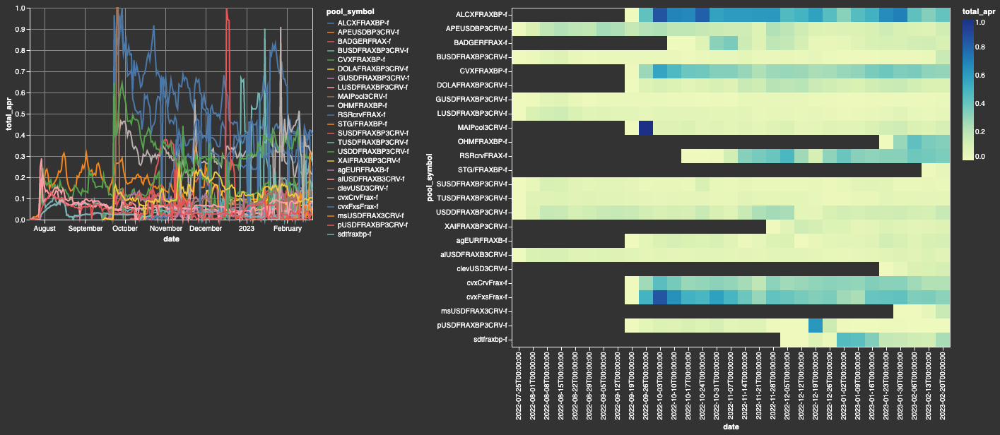

In [8]:
d = (
    df_mpool_snaps.loc[~df_mpool_snaps.total_apr.isna()]
    .merge(df_pools, on="pool_address")
    [['date', 'total_apr', 'pool_symbol']]
) 
d_weekly = (
    d.groupby(['pool_symbol', pd.Grouper(key='date', freq='W-MON')]).mean().reset_index()
)

selection = alt.selection_multi(fields=['pool_symbol'], bind='legend')

(
    alt.Chart(d)
    .mark_line()
    .encode(
        x="date:T", 
        y=alt.Y("total_apr:Q", scale=alt.Scale(domain=(0, 1), clamp=True)), 
        color="pool_symbol:N",
        opacity=alt.condition(selection, alt.value(1), alt.value(0.2))
    )
    .add_selection(selection) 
) | (
    alt.Chart(d_weekly)
    .mark_rect()
    .encode(
        x="date:O", 
        y="pool_symbol:N", 
        color=alt.Color("total_apr:Q", scale=alt.Scale(domain=(0, 1), clamp=True)), 
        tooltip=["date:O", "pool_symbol:N", "total_apr:Q"]
    )
    
)

In [9]:
# TODO: Show top 19 and aggregate others into single "Other" category.
d_mpool_share = (
    df_mpool_snaps[[
        'date', 'pool_address', 'crvfrax_in_mpool', 'crvfrax_in_all_mpools', 'crvfrax_share_mpools', 'crvfrax_share_fraxbp'
    ]]
    .merge(df_pools[['pool_address', 'pool_symbol']], how='left', on='pool_address')
)
d_mpool_share_last = d_mpool_share.loc[d_mpool_share.date == d_mpool_share.date.max()]

### (Chart) Metapool TVL Share 

- Segmented by pool name 

/opt/miniconda3/envs/flywheel-testing/lib/python3.10/site-packages/altair/utils/core.py:317: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for col_name, dtype in df.dtypes.iteritems():


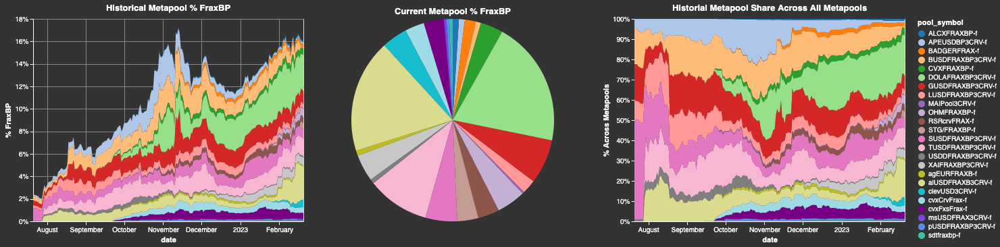

In [10]:
def chart_mpool_tvl_share(): 
    x = alt.X('date:T', title="date")
    color = alt.Color("pool_symbol:N", scale=alt.Scale(range=colors_28))

    chart_share_of_fraxbp = (
        alt.Chart(d_mpool_share)
        .mark_area()
        .encode(
            x=x, 
            y=alt.Y('crvfrax_share_fraxbp:Q', axis=alt.Axis(format=",%", title="% FraxBP")), 
            color=color, 
            tooltip=["pool_symbol:N", alt.Tooltip('crvfrax_share_fraxbp:Q', format=".1%", title='% FraxBP')]
        )
        .properties(title="Historical Metapool % FraxBP")
    ) 
    chart_share_of_fraxbp_current = (
        alt.Chart(d_mpool_share_last)
        .mark_arc()
        .encode(
            theta='crvfrax_share_fraxbp:Q', 
            color=color, 
            tooltip=["pool_symbol:N", alt.Tooltip('crvfrax_share_fraxbp:Q', format=".1%", title='% FraxBP')]
        )
        .properties(title="Current Metapool % FraxBP")
    )

    chart_metapool_share = (
        alt.Chart(d_mpool_share)
        .mark_area()
        .encode(
            x=x, 
            y=alt.Y('crvfrax_share_mpools:Q', axis=alt.Axis(format=",%", title="% Across Metapools"), scale=alt.Scale(domain=[0,1])), 
            color=color, 
            tooltip=["pool_symbol:N", alt.Tooltip('crvfrax_share_mpools:Q', format=".1%", title='% Across Metapools')]
        )
        .properties(title="Historial Metapool Share Across All Metapools")
    )

    return (chart_share_of_fraxbp | chart_share_of_fraxbp_current | chart_metapool_share)

chart_mpool_tvl_share()

/opt/miniconda3/envs/flywheel-testing/lib/python3.10/site-packages/altair/utils/core.py:317: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for col_name, dtype in df.dtypes.iteritems():


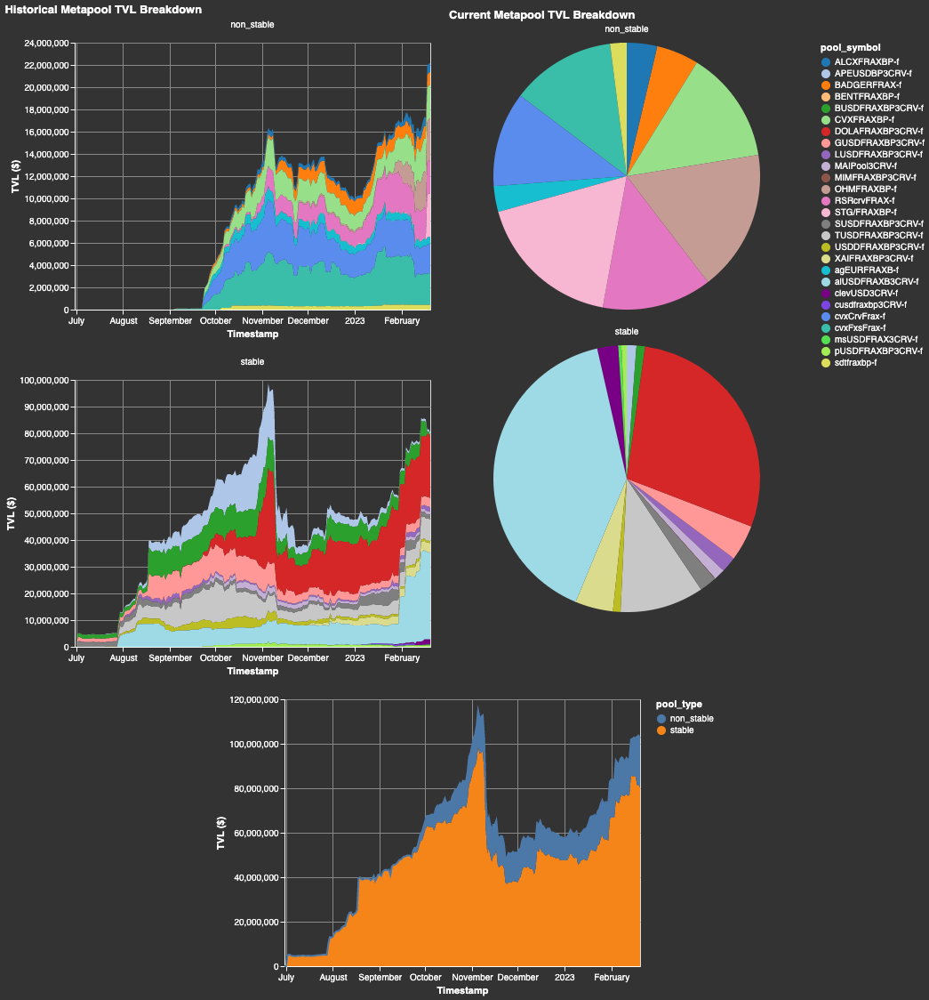

In [11]:
mpool_addrs = df_pools.loc[df_pools.pool_fraxbp_metapool == True].pool_address.unique()
df_tvl = (
    # Get share of non crvFRAX in each of the metapools 
    df_reserves.loc[
        df_reserves.pool_address.isin(mpool_addrs) & (df_reserves.pool_coin_address != addresses.token.crvfrax)
    ]
    .merge(df_pools[['pool_address', 'pool_type', 'pool_symbol']], how='left', on='pool_address')
)

x = alt.X("date:T", axis=alt.Axis(title="Timestamp"))
color = alt.Color("pool_symbol:N", scale=alt.Scale(range=colors_28))
facet = alt.Facet('pool_type:N', columns=1, header=alt.Header(title=None, labels=False))

# Charts 
chart_tvl_type_breakdown = (
    alt.Chart(df_tvl)
    .transform_aggregate(groupby=['date', 'pool_type'], tvl_pool_type="sum(reserves_usd)")
    .transform_joinaggregate(groupby=['date'], tvl_total="sum(tvl_pool_type)")
    .encode(
        x=x, 
        tooltip=[
            "date:T", 
            "pool_type:N",
            alt.Tooltip("tvl_pool_type:Q", format="$,d"), 
            alt.Tooltip("tvl_total:Q", format="$,d")
        ]
    )
)
chart_tvl_type_breakdown_area = (
    chart_tvl_type_breakdown
    .mark_area()
    .encode(
        y=alt.Y("tvl_pool_type:Q", axis=alt.Axis(title="TVL ($)")), 
        color="pool_type:N",
    )
)
chart_tvl_type_breakdown_line = (
    chart_tvl_type_breakdown
    .mark_line()
    .encode(y="tvl_total:Q")
)

alt.vconcat(
    alt.hconcat(
        (
            alt.Chart(df_tvl)
            .mark_area()
            .encode(
                x=x,
                y=alt.Y("reserves_usd:Q", axis=alt.Axis(title="TVL ($)")), 
                facet=facet, 
                color=color, 
                tooltip=[
                    "date:T", 
                    "pool_symbol:N", 
                    alt.Tooltip("reserves_usd:Q", format="$,d")
                ]
            )
            .resolve_scale(y="independent").resolve_axis("independent")
            .properties(title="Historical Metapool TVL Breakdown")
        ), 
        (
            alt.Chart(
                df_tvl.loc[df_tvl.date == df_tvl.date.max()]
            )
            .mark_arc()
            .encode(
                theta="reserves_usd:Q", 
                color=color, 
                facet=facet, 
                tooltip=[
                    "pool_symbol:N", 
                    alt.Tooltip("reserves_usd:Q", format="$,d", title="TVL"),
                ] 
            )
            .resolve_scale(theta="independent")
            .properties(title="Current Metapool TVL Breakdown")
        )
    ),
    alt.layer(chart_tvl_type_breakdown_area, chart_tvl_type_breakdown_line), 
    center=True
).resolve_legend(color="independent").resolve_scale(color="independent")

In [12]:
pd.set_option('display.float_format', lambda x: f'%.2f' % x)
ddf(df_tvl.loc[df_tvl.date == df_tvl.date.max()].groupby('pool_type').reserves_usd.sum().reset_index())

,pool_type,reserves_usd
0,non_stable,22184881.88
1,stable,80288738.05


In [13]:
(
    df_tvl.groupby(['date', 'pool_type']).reserves_usd.sum().reset_index()
        .groupby([pd.Grouper(key="date", freq="W-TUE", convention="s"), 'pool_type']).reserves_usd.mean().reset_index()
        .to_csv("metapool_tvl_segmented.csv", index=False)
)

### Snapshot Proposals 

We retrieve all snapshot proposals for convex gauge weight snapshots. 

Since votium bribes are intended to get vlCVX holders to vote for particular choices in this snapshot, this data is necessary. 

In [22]:
from flywheel_util.flows.votium import flow_votium_votes

async with get_client() as client:
    # set a concurrency limit of 10 on the 'small_instance' tag
    limit_id = await client.create_concurrency_limit(tag="network_request", concurrency_limit=1)

(
    df_proposals, 
    df_bribes, 
    df_choices, 
    df_votes, 
    df_epoches, 
    df_prices, 
    df_votium_frax, 
    df_gauge_info, 
    df_claims 
) = await flow_votium_votes()

/opt/miniconda3/envs/flywheel-testing/lib/python3.10/site-packages/prefect/flows.py:206: UserWarning: A flow named 'flow-votium-votes' and defined at '/Users/brycemorrow/Documents/code/flywheel/flywheel_util/src/flywheel_util/flows/votium.py:25' conflicts with another flow. Consider specifying a unique `name` parameter in the flow definition:

 `@flow(name='my_unique_name', ...)`
  warnings.warn(


14:26:50.345 | INFO    | prefect.engine - Created flow run 'hulking-otter' for flow 'flow-votium-votes'

14:26:50.397 | INFO    | Flow run 'hulking-otter' - Created task run 'query_snapshot_proposals-f39e1a07-0' for task 'query_snapshot_proposals'

14:26:50.399 | INFO    | Flow run 'hulking-otter' - Executing 'query_snapshot_proposals-f39e1a07-0' immediately...

14:26:50.409 | INFO    | Flow run 'hulking-otter' - Created task run 'query_bribe_asset_prices-18dc8e38-0' for task 'query_bribe_asset_prices'

14:26:50.412 | INFO    | Flow run 'hulking-otter' - Submitted task run 'query_bribe_asset_prices-18dc8e38-0' for execution.

14:26:50.424 | INFO    | Flow run 'hulking-otter' - Created task run 'query_gauge_info-511ae942-0' for task 'query_gauge_info'

14:26:50.425 | INFO    | Flow run 'hulking-otter' - Submitted task run 'query_gauge_info-511ae942-0' for execution.

14:26:50.435 | INFO    | Task run 'query_snapshot_proposals-f39e1a07-0' - Finished in state Cached(type=COMPLETED)

14:26:50.444 | INFO    | Task run 'query_bribe_asset_prices-18dc8e38-0' - Finished in state Cached(type=COMPLETED)

14:26:50.452 | INFO    | Task run 'query_gauge_info-511ae942-0' - Finished in state Cached(type=COMPLETED)

14:26:50.469 | INFO    | Flow run 'hulking-otter' - Created task run 'proposals_to_choices-fe8e9ef4-0' for task 'proposals_to_choices'

14:26:50.470 | INFO    | Flow run 'hulking-otter' - Executing 'proposals_to_choices-fe8e9ef4-0' immediately...

14:26:50.506 | INFO    | Task run 'proposals_to_choices-fe8e9ef4-0' - Finished in state Completed()

Number of votium snapshot proposals: 38


14:26:50.641 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-8' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:50.641 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-8' immediately...

14:26:50.653 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-6' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:50.654 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-6' immediately...

14:26:50.666 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-19' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:50.667 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-19' immediately...

14:26:50.679 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-31' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:50.679 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-31' immediately...

14:26:50.687 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-6' - Finished in state Cached(type=COMPLETED)

14:26:50.697 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-19' - Finished in state Cached(type=COMPLETED)

14:26:50.712 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-14' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:50.713 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-14' immediately...

14:26:50.731 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-16' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:50.732 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-16' immediately...

14:26:50.743 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-17' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:50.744 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-17' immediately...

14:26:50.757 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-21' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:50.758 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-21' immediately...

14:26:50.767 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-16' - Finished in state Cached(type=COMPLETED)

14:26:50.780 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-5' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:50.780 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-5' immediately...

14:26:50.792 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-21' - Finished in state Cached(type=COMPLETED)

14:26:50.809 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-17' - Finished in state Cached(type=COMPLETED)

14:26:50.823 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-27' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:50.824 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-27' immediately...

14:26:50.839 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-34' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:50.840 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-34' immediately...

14:26:50.851 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-18' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:50.852 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-18' immediately...

14:26:50.861 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-27' - Finished in state Cached(type=COMPLETED)

14:26:50.870 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-34' - Finished in state Cached(type=COMPLETED)

14:26:50.885 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-26' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:50.885 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-26' immediately...

14:26:50.903 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-3' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:50.904 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-3' immediately...

14:26:50.914 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-26' - Finished in state Cached(type=COMPLETED)

14:26:50.923 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-5' - Finished in state Cached(type=COMPLETED)

14:26:50.934 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-3' - Finished in state Cached(type=COMPLETED)

14:26:50.949 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-18' - Finished in state Cached(type=COMPLETED)

14:26:50.969 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-32' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:50.970 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-32' immediately...

14:26:50.979 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-11' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:50.979 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-11' immediately...

14:26:50.991 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-20' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:50.992 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-20' immediately...

14:26:51.004 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-25' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:51.005 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-25' immediately...

14:26:51.014 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-32' - Finished in state Cached(type=COMPLETED)

14:26:51.023 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-20' - Finished in state Cached(type=COMPLETED)

14:26:51.035 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-25' - Finished in state Cached(type=COMPLETED)

14:26:51.047 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-11' - Finished in state Cached(type=COMPLETED)

14:26:51.061 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-31' - Finished in state Cached(type=COMPLETED)

14:26:51.085 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-36' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:51.086 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-36' immediately...

14:26:51.095 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-10' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:51.096 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-10' immediately...

14:26:51.107 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-4' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:51.108 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-4' immediately...

14:26:51.117 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-36' - Finished in state Cached(type=COMPLETED)

14:26:51.125 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-8' - Finished in state Cached(type=COMPLETED)

14:26:51.137 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-4' - Finished in state Cached(type=COMPLETED)

14:26:51.163 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-10' - Finished in state Cached(type=COMPLETED)

14:26:51.167 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-7' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:51.168 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-7' immediately...

14:26:51.189 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-30' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:51.190 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-30' immediately...

14:26:51.198 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-13' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:51.198 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-13' immediately...

14:26:51.208 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-7' - Finished in state Cached(type=COMPLETED)

14:26:51.218 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-30' - Finished in state Cached(type=COMPLETED)

14:26:51.228 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-13' - Finished in state Cached(type=COMPLETED)

14:26:51.289 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-29' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:51.290 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-29' immediately...

14:26:51.299 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-12' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:51.300 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-12' immediately...

14:26:51.310 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-29' - Finished in state Cached(type=COMPLETED)

14:26:51.319 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-12' - Finished in state Cached(type=COMPLETED)

14:26:51.395 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-2' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:51.396 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-2' immediately...

14:26:51.406 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-0' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:51.406 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-0' immediately...

14:26:51.416 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-2' - Finished in state Cached(type=COMPLETED)

14:26:51.426 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-0' - Finished in state Cached(type=COMPLETED)

14:26:51.500 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-1' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:51.501 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-1' immediately...

14:26:51.510 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-22' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:51.511 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-22' immediately...

14:26:51.520 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-1' - Finished in state Cached(type=COMPLETED)

14:26:51.530 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-22' - Finished in state Cached(type=COMPLETED)

14:26:51.605 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-28' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:51.605 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-28' immediately...

14:26:51.613 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-14' - Finished in state Cached(type=COMPLETED)

14:26:51.625 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-28' - Finished in state Cached(type=COMPLETED)

14:26:51.708 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-35' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:51.709 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-35' immediately...

14:26:51.720 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-35' - Finished in state Cached(type=COMPLETED)

14:26:51.814 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-9' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:51.815 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-9' immediately...

14:26:51.827 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-9' - Finished in state Cached(type=COMPLETED)

14:26:51.920 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-15' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:51.921 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-15' immediately...

14:26:51.933 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-15' - Finished in state Cached(type=COMPLETED)

14:26:52.024 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-24' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:52.025 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-24' immediately...

14:26:52.038 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-24' - Finished in state Cached(type=COMPLETED)

14:26:52.130 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-33' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:52.131 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-33' immediately...

14:26:52.144 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-33' - Finished in state Cached(type=COMPLETED)

14:26:52.231 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-37' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:52.232 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-37' immediately...

14:26:52.242 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-37' - Finished in state Cached(type=COMPLETED)

14:26:52.343 | INFO    | Flow run 'hulking-otter' - Created task run 'blocking_query_snapshot_votes_for_proposal-df415f46-23' for task 'blocking_query_snapshot_votes_for_proposal'

14:26:52.344 | INFO    | Flow run 'hulking-otter' - Executing 'blocking_query_snapshot_votes_for_proposal-df415f46-23' immediately...

14:26:52.356 | INFO    | Task run 'blocking_query_snapshot_votes_for_proposal-df415f46-23' - Finished in state Cached(type=COMPLETED)

Here is the count of unique votes per each convex gauge weight snapshot proposal


,proposal_round,vote_count,proposal_id
0,1,164,QmUjELF3ABSV2f5xgQrJgEnZTPb86DAtT6gzoa8RfHUuAK
1,2,146,QmTQBqsG7dW93xX8zBZnevMa1mbEmDHUx7QabAYyn6mFJi
2,3,497,QmaS9vd1vJKQNBYX4KWQ3nppsTT3QSL3nkz5ZYSwEJk6hZ
3,4,703,QmacSRTG62rnvAyBuNY3cVbCtBHGV8PuGRoL32Dm6MPy5y
4,5,854,QmPSBg5aTPb82sZRqF9ouUQQ5CkbpRaJMdHYUMieN3dpqv
5,6,939,QmSADHyqmddX9ANsTkjSefHf5B2v8iFyxDvQsNF93NpYhA
6,7,1051,QmaV4eMYuQyyuXUqBQr1q1icPDHTrMJd6poYXiv5a4fxg7
7,8,1464,QmRgsaGswSgzuzaiiH385StTGsv5TVdhAA1LWBGWR3yyLp
8,9,1939,QmaqfAtEoAc27WSpfN4KsLoTwRPY2L8W3cCtXjL8tvTeDd
9,10,1993,QmVNzDbUX8mbs6a31uW3bmnRpFCtg7Aqa1pzcgKZ1qHkwL


14:26:53.799 | INFO    | Flow run 'hulking-otter' - Created task run 'process_snapshot_votes-3d53997e-0' for task 'process_snapshot_votes'

14:26:53.800 | INFO    | Flow run 'hulking-otter' - Executing 'process_snapshot_votes-3d53997e-0' immediately...

14:26:55.571 | INFO    | Task run 'process_snapshot_votes-3d53997e-0' - Finished in state Completed()

14:26:55.614 | INFO    | Flow run 'hulking-otter' - Created task run 'query_votium_epoches-aa434c91-0' for task 'query_votium_epoches'

14:26:55.615 | INFO    | Flow run 'hulking-otter' - Executing 'query_votium_epoches-aa434c91-0' immediately...

14:26:55.844 | INFO    | Task run 'query_votium_epoches-aa434c91-0' - Finished in state Completed()

14:26:55.860 | INFO    | Flow run 'hulking-otter' - Created task run 'validate_proposals_vs_epoches-12f95378-0' for task 'validate_proposals_vs_epoches'

14:26:55.861 | INFO    | Flow run 'hulking-otter' - Executing 'validate_proposals_vs_epoches-12f95378-0' immediately...

14:26:55.890 | INFO    | Task run 'validate_proposals_vs_epoches-12f95378-0' - Finished in state Completed()

14:26:55.901 | INFO    | Flow run 'hulking-otter' - Created task run 'process_df_epoches-547de7e8-0' for task 'process_df_epoches'

14:26:55.902 | INFO    | Flow run 'hulking-otter' - Executing 'process_df_epoches-547de7e8-0' immediately...

14:26:55.929 | INFO    | Task run 'process_df_epoches-547de7e8-0' - Finished in state Completed()

14:26:55.941 | INFO    | Flow run 'hulking-otter' - Created task run 'query_votium_bribes-7f2656a2-0' for task 'query_votium_bribes'

14:26:55.942 | INFO    | Flow run 'hulking-otter' - Executing 'query_votium_bribes-7f2656a2-0' immediately...

14:26:56.282 | INFO    | Task run 'query_votium_bribes-7f2656a2-0' - Finished in state Completed()

14:26:56.297 | INFO    | Flow run 'hulking-otter' - Created task run 'label_bribes-c844daa8-0' for task 'label_bribes'

14:26:56.298 | INFO    | Flow run 'hulking-otter' - Executing 'label_bribes-c844daa8-0' immediately...

Label count for addresses submitting bribes
investor custodian    302
frax1.eth              21
unknown                 7
Name: briber_label, dtype: int64


14:26:58.299 | INFO    | Task run 'label_bribes-c844daa8-0' - Finished in state Completed()

14:26:58.315 | INFO    | Flow run 'hulking-otter' - Created task run 'query_votium_claims-674283c2-0' for task 'query_votium_claims'

14:26:58.316 | INFO    | Flow run 'hulking-otter' - Executing 'query_votium_claims-674283c2-0' immediately...

Found 57 `Claimed` events on votium multi merkle stash for account 0xb1748c79709f4ba2dd82834b8c82d4a505003f27
Found 4 `Claimed` events on votium multi merkle stash for account 0x7038c406e7e2c9f81571557190d26704bb39b8f3


14:26:59.078 | INFO    | Task run 'query_votium_claims-674283c2-0' - Finished in state Completed()

14:26:59.097 | INFO    | Flow run 'hulking-otter' - Created task run 'process_events_claimed-2c22c94f-0' for task 'process_events_claimed'

14:26:59.098 | INFO    | Flow run 'hulking-otter' - Executing 'process_events_claimed-2c22c94f-0' immediately...

14:27:02.602 | INFO    | Task run 'process_events_claimed-2c22c94f-0' - Finished in state Completed()

14:27:02.624 | INFO    | Flow run 'hulking-otter' - Created task run 'join_bribes_choices_epoches_prices-e26344c9-0' for task 'join_bribes_choices_epoches_prices'

14:27:02.626 | INFO    | Flow run 'hulking-otter' - Executing 'join_bribes_choices_epoches_prices-e26344c9-0' immediately...

14:27:02.685 | INFO    | Task run 'join_bribes_choices_epoches_prices-e26344c9-0' - Finished in state Completed()

14:27:02.698 | INFO    | Flow run 'hulking-otter' - Created task run 'standardize_choices-fdfeea84-0' for task 'standardize_choices'

14:27:02.699 | INFO    | Flow run 'hulking-otter' - Executing 'standardize_choices-fdfeea84-0' immediately...

/Users/brycemorrow/Documents/code/flywheel/flywheel_util/src/flywheel_util/tasks/votium.py:430: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_votium_frax.bribe_choice = df_votium_frax.bribe_choice.apply(preprocess_choice)


14:27:02.753 | INFO    | Task run 'standardize_choices-fdfeea84-0' - Finished in state Completed()

/opt/miniconda3/envs/flywheel-testing/lib/python3.10/site-packages/prefect/utilities/asyncutils.py:258: UserWarning: `sync` called from an asynchronous context; you should `await` the async function directly instead.
  warnings.warn(
sys:1: ResourceWarning: Unclosed socket <zmq.Socket(zmq.PUSH) at 0x2a0083940>
sys:1: ResourceWarning: Unclosed socket <zmq.Socket(zmq.PUSH) at 0x29e8f89a0>


14:27:02.899 | INFO    | Flow run 'hulking-otter' - Finished in state Completed()

/opt/miniconda3/envs/flywheel-testing/lib/python3.10/site-packages/altair/utils/core.py:317: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for col_name, dtype in df.dtypes.iteritems():


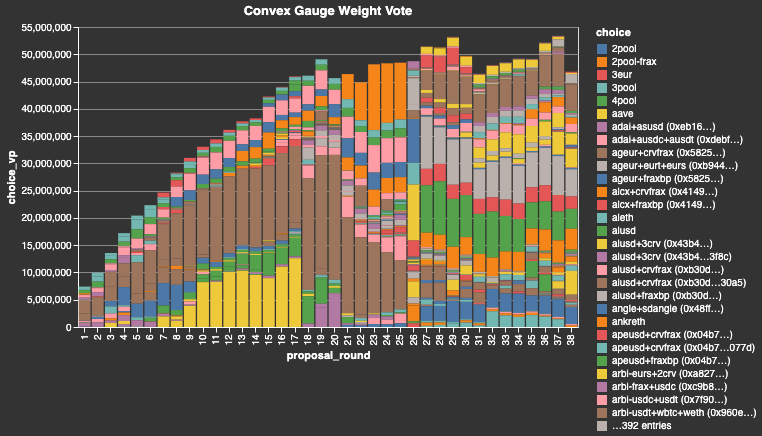

In [23]:
(
    alt.Chart((
        df_votes[['proposal_round', 'choice', 'choice_vp']]
        .groupby(['proposal_round', 'choice']).sum()
        .reset_index() 
    ))
    .mark_bar()
    .encode(
        x="proposal_round:O", 
        y="choice_vp:Q", 
        color="choice:N", 
        tooltip=["choice:N", "choice_vp:Q"]
    )
    .properties(title="Convex Gauge Weight Vote", width=500) 
)

,pool_address,pool_lp_token,pool_symbol,pool_name,pool_type,pool_cvx_token,pool_gauge,pool_fraxbp_metapool,pool_fraxbp
0,0x04b727c7e246ca70d496ecf52e6b6280f3c8077d,0x04b727c7e246ca70d496ecf52e6b6280f3c8077d,APEUSDBP3CRV-f,Curve.fi Factory USD Metapool: apeUSDFRAXBP,stable,0x5ec62bad0fa0c6b7f87b3b86edfe1bcd2a3139e2,0xd6e48cc0597a1ee12a8beeb88e22bfdb81777164,True,False


,bribe_amount,bribe_amount_usd,bribe_choice,bribe_epoch_id,bribe_from,bribe_token,bribe_token_name,briber_label,bribe_choice_index,epoch_end_date,epoch_start_date,proposal_round,gauge_name,gauge_short_name,gauge_address,pool_type,is_metapool
44,527.04,3528.19,busd+fraxbp (0x8fdb…),0x924d8d427161d9f064be26a526867e3e54a8b8bdd54372ef6e8656651e4be186,0x5180db0237291A6449DdA9ed33aD90a38787621c,0x3432b6a60d23ca0dfca7761b7ab56459d9c964d0,FXS,investor custodian,108,2022-07-25,2022-07-21,23,busd+fraxbp (0x8fdb…4190),busd+fraxbp (0x8fdb…),0xaeac6dcd12cc0be74c8f99efe4bb5205a1f9a608,stable,True


/opt/miniconda3/envs/flywheel-testing/lib/python3.10/site-packages/altair/utils/core.py:317: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for col_name, dtype in df.dtypes.iteritems():


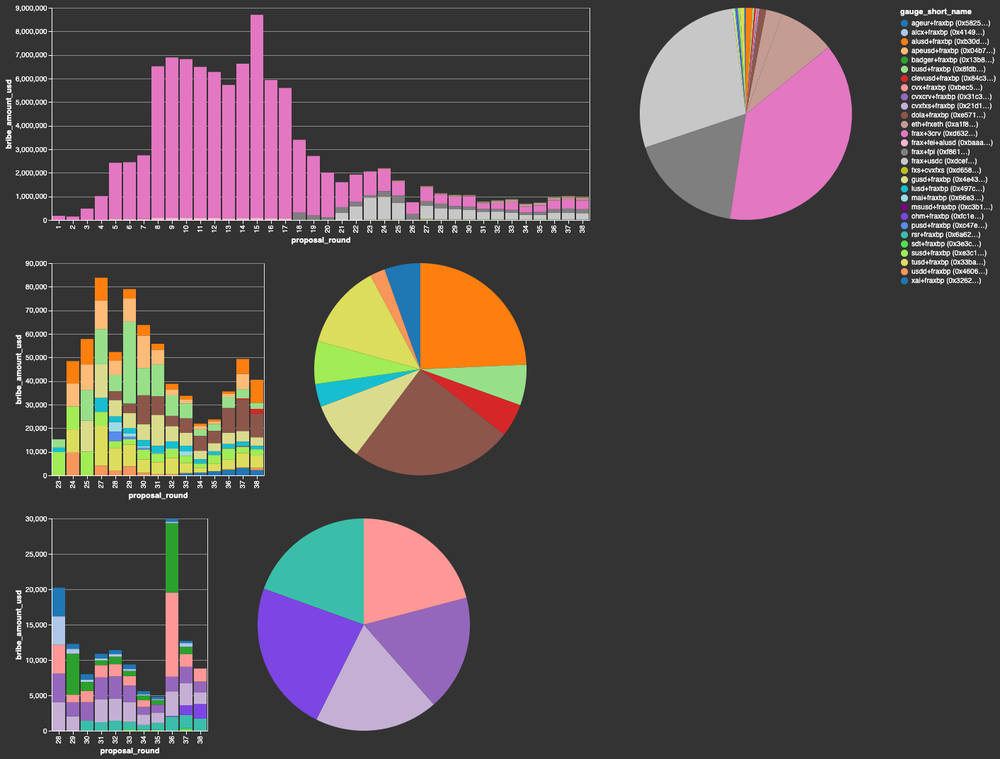

In [24]:
color = alt.Color('gauge_short_name:N', scale=alt.Scale(range=colors_28))

def chart_bribes_historical(df): 
    return (
        alt.Chart(df)
        .transform_joinaggregate(groupby=['proposal_round'], bribe_amount_total_usd="sum(bribe_amount_usd)")
        .mark_bar()
        .encode(
            x="proposal_round:O", 
            y="bribe_amount_usd:Q", 
            color=color, 
            tooltip=[
                alt.Tooltip('epoch_end_date:T'), 
                alt.Tooltip('gauge_short_name:N'), 
                alt.Tooltip('bribe_token_name:N'),
                alt.Tooltip('bribe_amount:Q', format=",d"),
                alt.Tooltip('bribe_amount_usd:Q', format="$,d"),
                alt.Tooltip('bribe_amount_total_usd:Q', format="$,d"), 
            ]
        )
    )
    
    
def chart_bribes_last_round(df): 
    return (
        alt.Chart(df)
        .mark_arc()
        .encode(
            theta="bribe_amount_usd:Q", 
            color=color, 
            tooltip=['gauge_short_name:N', alt.Tooltip('bribe_amount_usd:Q', format="$,d")]
        )
    )

first_row(df_pools) 

data = df_votium_frax.copy().merge(
    df_pools[['pool_gauge', 'pool_type']].dropna().rename(columns={"pool_gauge": "gauge_address"}), 
    how='left', 
    on='gauge_address', 
)

metapool_gauge_addrs = df_pools.loc[df_pools.pool_fraxbp_metapool == True].dropna(subset='pool_gauge').pool_gauge.unique()
data['is_metapool'] = data.gauge_address.apply(lambda addr: addr in metapool_gauge_addrs)

last_round = data.proposal_round.max()
data_last = data.loc[data.proposal_round == last_round]
data_mp = data.loc[data.is_metapool == True] 
data_mp_stable = data_mp.loc[data_mp.pool_type == 'stable']
data_mp_nonstable = data_mp.loc[data_mp.pool_type == 'non_stable']
data_mp_stable_last = data_mp_stable.loc[data_mp_stable.proposal_round == last_round]
data_mp_nonstable_last = data_mp_nonstable.loc[data_mp_nonstable.proposal_round == last_round]

dfp = df_proposals.copy()
dfp.proposal_end = pd.to_datetime(dfp.proposal_end)

first_row(data_mp)

# TODO: Bribe for FraxBP in round 26 was using cvxCRV, why is this? 
(
    (chart_bribes_historical(data) | chart_bribes_last_round(data_last)) & 
    (chart_bribes_historical(data_mp_stable) | chart_bribes_last_round(data_mp_stable_last)).resolve_scale(theta='independent', color="shared") & 
    (chart_bribes_historical(data_mp_nonstable) | chart_bribes_last_round(data_mp_nonstable_last)).resolve_scale(theta='independent', color="shared") 
)

In [25]:
first_row(df_pool_snaps)
first_row(df_votium_frax)

,date,pool_address,snap_lp_price_usd,snap_tvl_usd,snap_vol_usd,timestamp,base_apr,crv_apr,cvx_apr,extra_rewards_apr,total_apr,snap_lp_supply,snap_liq_util
0,2022-06-28,0xdcef968d416a41cdac0ed8702fac8128a64241a2,1.00,9074298.86,461240.14,1656378320,0.00,0.00,0.00,0.00,0.00,9080201.10,0.05


,bribe_amount,bribe_amount_usd,bribe_choice,bribe_epoch_id,bribe_from,bribe_token,bribe_token_name,briber_label,bribe_choice_index,epoch_end_date,epoch_start_date,proposal_round,gauge_name,gauge_short_name,gauge_address
0,37280.64,175222.87,frax+3crv (0xd632…),0xc841db892a58168d21262eb8e2f97d651fb354896fa90ac3d6bcfad00319c535,0x234D953a9404Bf9DbC3b526271d440cD2870bCd2,0x3432b6a60d23ca0dfca7761b7ab56459d9c964d0,FXS,frax1.eth,32,2021-09-21,2021-09-16,1,frax+3crv (0xd632…ed3b),frax+3crv (0xd632…),0x72e158d38dbd50a483501c24f792bdaaa3e7d55c


In [26]:
first_row(df_epoches) 

,proposal_round,epoch_id,epoch_start_date,epoch_end_date
0,1,0xc841db892a58168d21262eb8e2f97d651fb354896fa90ac3d6bcfad00319c535,2021-09-16,2021-09-21


In [27]:
first_row(df_epoches)

,proposal_round,epoch_id,epoch_start_date,epoch_end_date
0,1,0xc841db892a58168d21262eb8e2f97d651fb354896fa90ac3d6bcfad00319c535,2021-09-16,2021-09-21


In [28]:
df_ranges = df_epoches[['epoch_start_date']].sort_values('epoch_start_date').reset_index(drop=True)
df_ranges['epoch_start_date_next'] = df_ranges.epoch_start_date.shift(-1).fillna(pd.Timestamp.now())

# Amount of usd bribes per gauge and round (identified by timestamp) 
df_bribe_gauge_round = df_votium_frax.groupby(['gauge_address', 'epoch_start_date', 'epoch_end_date'])['bribe_amount_usd'].sum().reset_index()

# Charts here validated by going to https://curve.fi/#/ethereum/pools
# entering "fraxbp" into the search bar and comparing the tvl of all pools in the UI 
# to the tvl in the charts seen here. 
data = (
    df_mpool_snaps
    .merge(df_pools, how='left', on='pool_address')
    .merge(df_reserves, how='left', on=['pool_address', 'date'])
    .merge(df_coins, how='left', on=['pool_address', 'pool_coin_address'])
    .merge(
        df_bribe_gauge_round, 
        how='left', 
        left_on=['pool_gauge', 'date'], 
        right_on=['gauge_address', 'epoch_end_date'], 
    )
    .sort_values('date').reset_index(drop=True)
)
# For each timestamp, determine the window that it falls within, defined by both a start and end point 
data = pd.merge_asof(
    data, 
    df_ranges.rename(columns={'epoch_start_date': 'window_start'})[['window_start']], 
    left_on='date', 
    right_on='window_start', 
    direction="backward",
    allow_exact_matches=True # Window lower bound should be inclusive 
)
data = pd.merge_asof(
    data, 
    df_ranges.rename(columns={'epoch_start_date_next': 'window_end'})[['window_end']], 
    left_on='date', 
    right_on='window_end', 
    direction="forward", 
    allow_exact_matches=False # Window upper bound should be non-inclusive 
)
data['next_epoch_tvl'] = data.groupby(['pool_name', 'window_start', 'window_end'])['snap_tvl_usd'].transform('mean')
data['tvl_to_bribe_ratio'] = data.next_epoch_tvl / data.bribe_amount_usd

/opt/miniconda3/envs/flywheel-testing/lib/python3.10/site-packages/altair/utils/core.py:317: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for col_name, dtype in df.dtypes.iteritems():


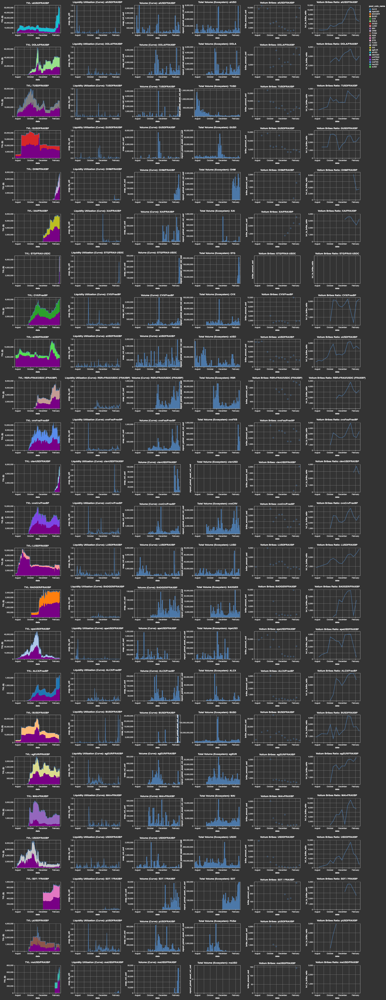

In [29]:
ncols = 1 
rows = []
row = []
pool_names = data.pool_name.unique().tolist()
groups = list(data.groupby("pool_name"))

def group_sort_key(g): 
    # Sort by tvl at last time point 
    gdf = g[1]
    return -1 * gdf.loc[gdf.date == gdf.date.max(), 'reserves_usd'].sum()

groups.sort(key=group_sort_key)
for pool_name, sdf in groups: 
    sdf = sdf[[
        'pool_name', 'pool_gauge', 'date', 'reserves_usd', 'snap_tvl_usd', 
        'pool_coin_name', 'snap_vol_usd', 'snap_liq_util', 'mpool_paired_asset_vol_usd', 
        'epoch_start_date', 'bribe_amount_usd', 'next_epoch_tvl', 'tvl_to_bribe_ratio'
    ]]
    paired_asset = [e for e in sdf.pool_coin_name.unique() if e != 'crvFRAX'][0]
    dfb = sdf.loc[sdf.pool_coin_name == 'crvFRAX']
    
    # Chart showing TVL in the pool 
    tvl_base = (
        alt.Chart(sdf)
        .transform_calculate(stack_order="datum.pool_coin_name === 'crvFRAX' ? 0 : 1")
        .transform_joinaggregate(groupby=['pool_name', 'date'], tvl_total="sum(reserves_usd)")
        .encode(x="date:T", order="stack_order:O", )
    )
    chart_tvl_area = (
        tvl_base
        .mark_area()
        .encode(
            y=alt.Y("reserves_usd:Q", axis=alt.Axis(title="TVL ($)")), 
            color=alt.Color("pool_coin_name:N", scale=alt.Scale(range=colors_28)), 
            tooltip=[
                alt.Tooltip("pool_coin_name:N"), 
                alt.Tooltip("date:Q", format='$,d'), 
                alt.Tooltip("tvl_total:Q", format='$,d'), 
            ]
        )
    )
    chart_tvl_line = (
        tvl_base
        .transform_filter("datum.pool_coin_name == 'crvFRAX'")
        .mark_line()
        .encode(y="tvl_total:Q")
    )
    chart_pool_liquidity = alt.layer(chart_tvl_area, chart_tvl_line)
    # Chart showing volume in the pool 
    vol_base = (
        alt.Chart(sdf)
        .transform_filter("datum.pool_coin_name !== 'crvFRAX'")
        .encode(x="date:T", order="stack_order:O")
    )
    chart_vol_bar = (
        vol_base
        .mark_bar()
        .encode(
            y="snap_vol_usd:Q", 
            tooltip=[
                alt.Tooltip("snap_vol_usd:Q", format='$,d'), 
            ]
        )
    )
    # Chart showing liquidity utilization in the pool 
    chart_liq_util = (
        vol_base
        .mark_line()
        .encode(
            y=alt.Y("snap_liq_util:Q", scale=alt.Scale(domain=[0,1.0], clamp=True)), 
            tooltip=[
                alt.Tooltip("snap_liq_util:Q", format='$,d'), 
            ]
        )
    )
    # Chart showing ecosystem wide tvl for non crvFRAX assets 
    chart_vol_total = (
        vol_base
        .mark_bar()
        .encode(
            y="mpool_paired_asset_vol_usd:Q", 
            tooltip=[
                alt.Tooltip("mpool_paired_asset_vol_usd:Q", format='$,d'), 
            ]
        )
    )
    # Chart showing ecosystem wide tvl for non crvFRAX assets 
    chart_bribes = (
        vol_base
        .mark_point()
        .encode(
            y="bribe_amount_usd:Q", 
            tooltip=[
                alt.Tooltip("bribe_amount_usd:Q", format='$,d'), 
            ]
        )
    )
    chart_bribe_ratio = (
        alt.Chart(dfb.loc[~dfb.tvl_to_bribe_ratio.isna()])
        .mark_line()
        .encode(
            x="date:T",
            y="tvl_to_bribe_ratio:Q", 
            tooltip=[
                alt.Tooltip("tvl_to_bribe_ratio:Q", format='.2f'), 
            ]
        )
    )

    pool_symbol = pool_name.split(':')[-1].strip()
    w = 250
    h = 150
    
    row.append(
        alt.hconcat(
            chart_pool_liquidity.properties(title=f"TVL: {pool_symbol}", width=w, height=h), 
            chart_liq_util.properties(title=f"Liquidity Utilization (Curve): {pool_symbol}", width=w, height=h), 
            chart_vol_bar.properties(title=f"Volume (Curve): {pool_symbol}", width=w, height=h), 
            chart_vol_total.properties(title=f"Total Volume (Ecosystem): {paired_asset}", width=w, height=h), 
            chart_bribes.properties(title=f"Votium Bribes: {pool_symbol}", width=w, height=h), 
            chart_bribe_ratio.properties(title=f"Votium Bribes Ratio: {pool_symbol}", width=w, height=h), 
            bounds='flush', 
            spacing=75
        )
        .resolve_scale(x="shared")
    )
    if len(row) == ncols: 
        rows.append(row) 
        row = []
    
rows = [
    alt.hconcat(*row) 
    .resolve_scale(x="shared")
    for row in rows
]
chart = (
    alt.vconcat(*rows)
    .resolve_scale(x="shared")
)
chart

In [30]:
# data.head()

/opt/miniconda3/envs/flywheel-testing/lib/python3.10/site-packages/altair/utils/core.py:317: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for col_name, dtype in df.dtypes.iteritems():


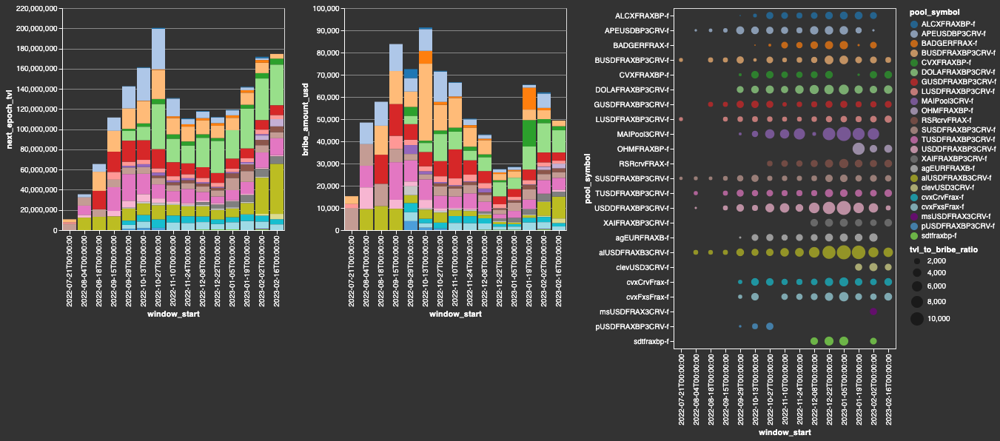

In [31]:
d = data[['pool_name', 'pool_symbol', 'pool_coin_name', 'window_start', 'window_end', 'next_epoch_tvl', 'bribe_amount_usd', 'tvl_to_bribe_ratio']]
d = d.loc[~d.next_epoch_tvl.isna() & (d.pool_coin_name == 'crvFRAX') & ~d.bribe_amount_usd.isna()].drop_duplicates()
(
    alt.Chart(d)
    .mark_bar()
    .encode(
        x="window_start:O", y="next_epoch_tvl:Q", color=alt.Color("pool_symbol:N", scale=alt.Scale(range=colors_24)), 
        tooltip=["window_start:O", "pool_symbol:N", "next_epoch_tvl:Q"]
    ) 
    | 
    alt.Chart(d)
    .mark_bar()
    .encode(
        x="window_start:O", y="bribe_amount_usd:Q", color=alt.Color("pool_symbol:N", scale=alt.Scale(range=colors_24)), 
        tooltip=["window_start:O", "pool_symbol:N", "bribe_amount_usd:Q"]
    )
    | 
    alt.Chart(d)
    .mark_circle()
    .encode(
        x="window_start:O", 
        y="pool_symbol:N", 
        color=alt.Color("pool_symbol:N", scale=alt.Scale(range=colors_24)), 
        size="tvl_to_bribe_ratio:Q", 
        tooltip=["window_start:O", "pool_symbol:N", "tvl_to_bribe_ratio:Q"]
    )
)